In [ ]:
# SEMMA-Based Chronic Kidney Disease Prediction

In [ ]:
# 1. Sample: Load Required Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix,
    ConfusionMatrixDisplay, RocCurveDisplay,
    classification_report
)

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

In [ ]:
#1. Sample: Load Dataset
df = pd.read_csv(r"/content/sample_data/chronic_kidney_disease_dataset.csv")
print("Initial shape:", df.shape)

Initial shape: (20000, 25)


In [ ]:
# Clean column names (strip whitespaces and lowercase)
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')


In [ ]:
# 3. Explore: Understand Data
# Convert categorical columns to numeric
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].astype('category').cat.codes

In [ ]:
df.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,57.45,83.48,1.020,0,2,1,1,1,0,132.64,...,38.33,7103.95,4.03,0,1,0,0,1,0,1
1,47.93,82.83,1.015,0,2,0,0,0,1,154.03,...,38.33,12000.00,4.30,0,1,0,0,0,0,1
2,59.72,70.63,1.020,5,3,1,0,0,1,70.00,...,38.15,5018.69,3.92,0,1,0,1,1,1,0
3,72.85,85.80,1.020,5,4,0,1,0,1,115.82,...,34.21,6769.73,5.20,1,1,1,1,0,1,0
4,46.49,65.10,1.025,2,3,0,0,0,1,182.65,...,39.53,9834.33,4.81,1,1,0,1,0,0,0


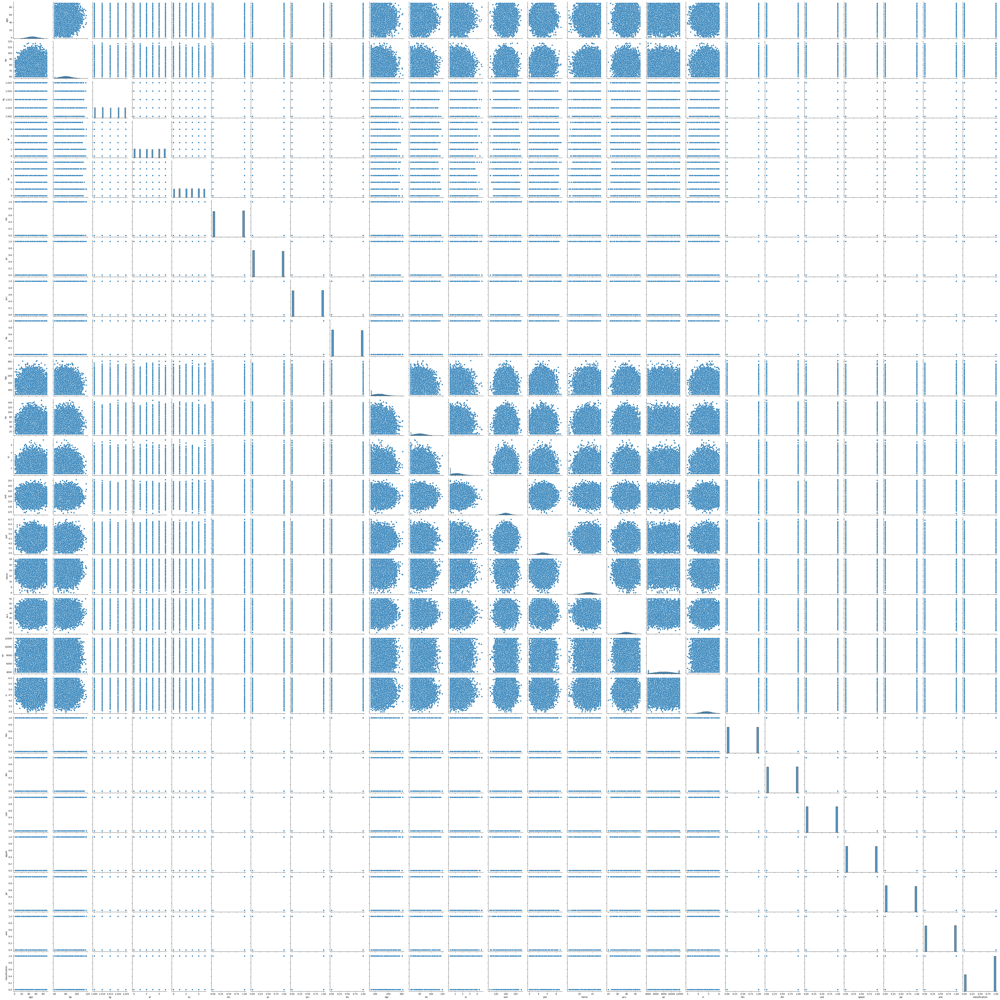

In [36]:
#VIsualize the data
sns.pairplot(df)

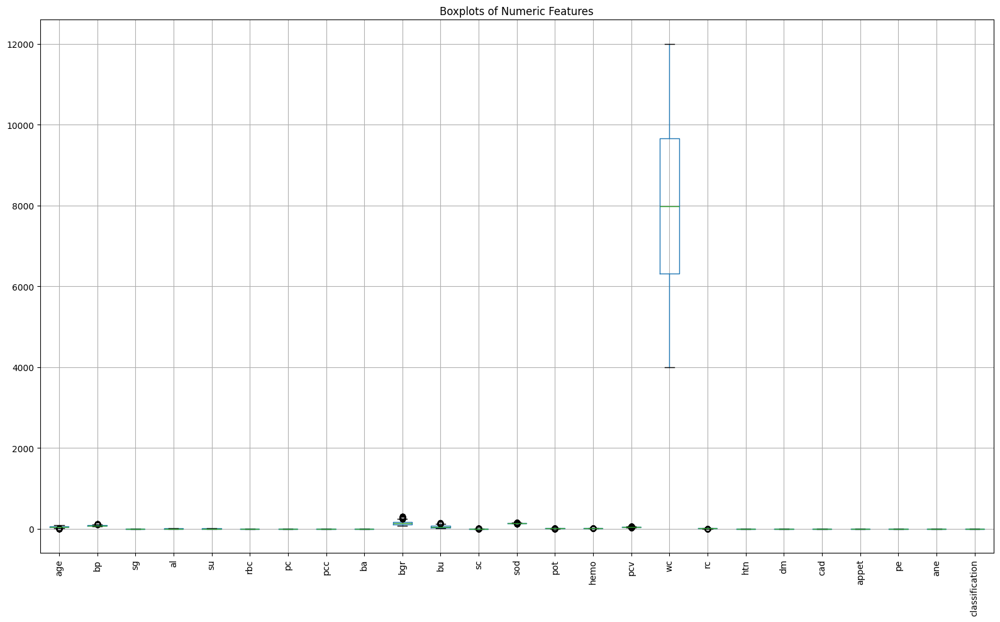

In [ ]:
# Boxplots for numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns
plt.figure(figsize=(16, 10))
df[numeric_cols].boxplot(rot=90)
plt.title("Boxplots of Numeric Features")
plt.tight_layout()
plt.show()

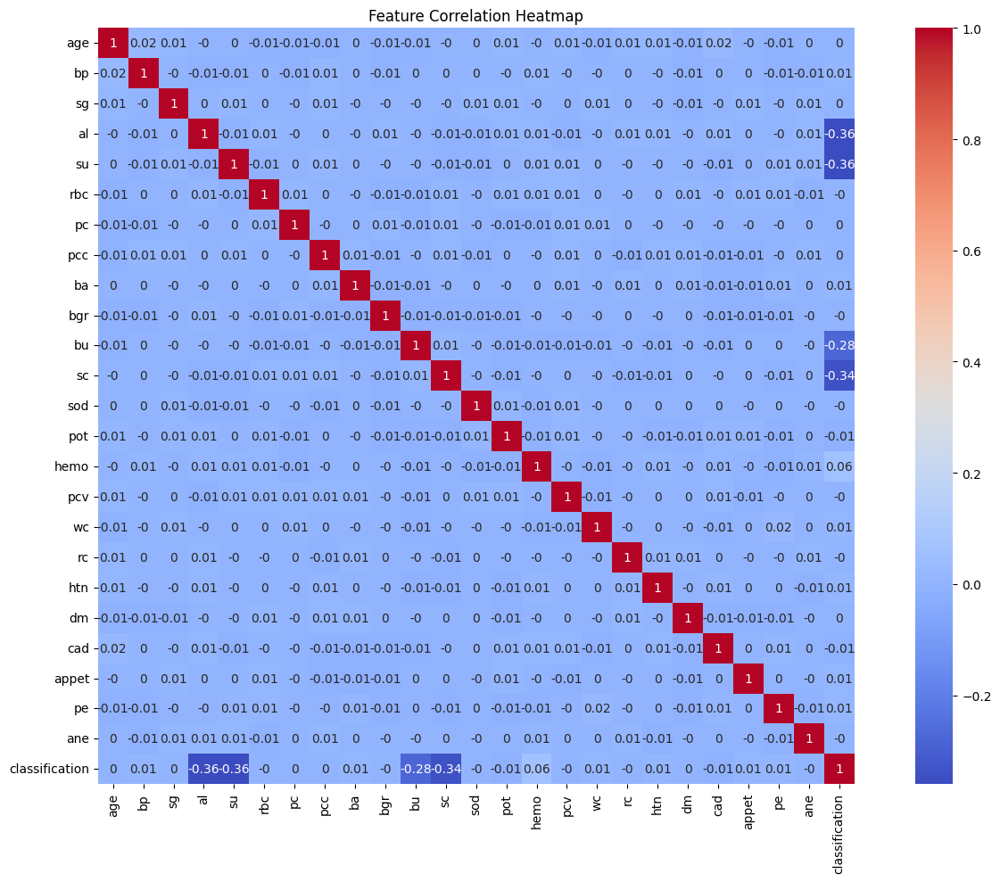

In [8]:
# Heatmap of correlation
plt.figure(figsize=(14, 10))
sns.heatmap(df.corr().round(2), annot=True, cmap='coolwarm', square=True)
plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

In [9]:
# 4. Modify: Preprocessing (Imputation + Scaling)
imputer = SimpleImputer(strategy='mean')
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)


In [10]:
# Separate features and target
X = df_imputed.drop('classification', axis=1)
y = df_imputed['classification']

In [11]:
# Feature Selection
selector = SelectKBest(score_func=mutual_info_classif, k=10)
X_selected = selector.fit_transform(X, y)
selected_features = X.columns[selector.get_support()]
print("Selected Features:", list(selected_features))


Selected Features: ['sg', 'al', 'su', 'pc', 'bu', 'sc', 'pot', 'hemo', 'wc', 'pe']


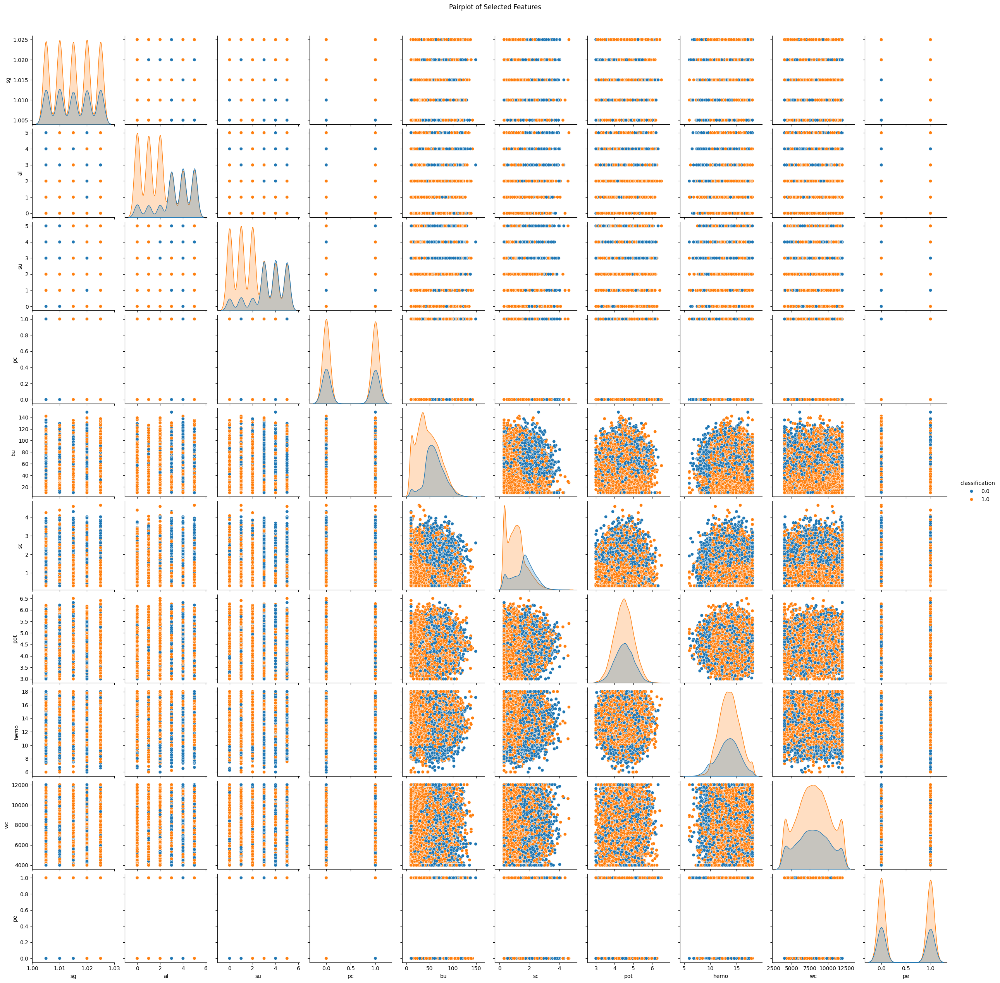

In [12]:
# Pairplot of selected features with target
selected_df = df_imputed[selected_features.tolist() + ['classification']]
sns.pairplot(selected_df, hue='classification')
plt.suptitle("Pairplot of Selected Features", y=1.02)
plt.show()

In [13]:
# Interaction Terms
poly = PolynomialFeatures(interaction_only=True, include_bias=False)
X_interact = poly.fit_transform(X[selected_features])
interaction_feature_names = poly.get_feature_names_out(selected_features)


In [14]:
# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_interact)

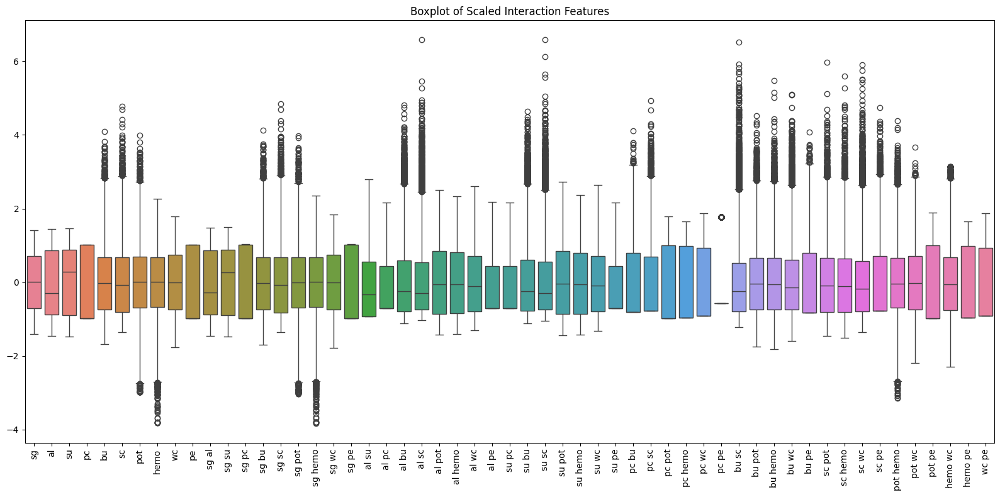

In [15]:
# Boxplot of scaled features
plt.figure(figsize=(16, 8))
sns.boxplot(data=pd.DataFrame(X_scaled, columns=interaction_feature_names))
plt.xticks(rotation=90)
plt.title("Boxplot of Scaled Interaction Features")
plt.tight_layout()
plt.show()

In [16]:
# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [17]:
# 5. Model: Define Models & Hyperparameter Grids
models = {
    "Logistic Regression": {
        "model": LogisticRegression(max_iter=1000),
        "params": { 'C': [0.01, 0.1, 1, 10] }
    },
    "SVM": {
        "model": SVC(probability=True),
        "params": { 'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf'] }
    },
    "Naive Bayes": {
        "model": GaussianNB(),
        "params": {}
    },
     "Gradient Boosting": {
        "model": GradientBoostingClassifier(),
        "params": { 'n_estimators': [50, 100], 'learning_rate': [0.01, 0.1], 'max_depth': [3, 5] }
    },
    "XGBoost": {
        "model": XGBClassifier(eval_metric='logloss'),
        "params": { 'n_estimators': [50, 100], 'learning_rate': [0.01, 0.1], 'max_depth': [3, 5] }
    },
    "Decision Tree": {
        "model": DecisionTreeClassifier(),
        "params": { 'max_depth': [3, 5, None] }
    },
    "Random Forest": {
        "model": RandomForestClassifier(),
        "params": { 'n_estimators': [50, 100], 'max_depth': [3, 5, None] }
    },
    "KNN": {
        "model": KNeighborsClassifier(),
        "params": { 'n_neighbors': [3, 5, 7] }
    }
}


===== Logistic Regression =====
Best Parameters: {'C': 10}
Best Cross-Validation Accuracy: 0.8703
Accuracy : 0.8695
Precision: 0.8868
Recall   : 0.9243
F1 Score : 0.9052
AUC      : 0.9386
Classification Report:
               precision    recall  f1-score   support

         0.0       0.83      0.76      0.79      1304
         1.0       0.89      0.92      0.91      2696

    accuracy                           0.87      4000
   macro avg       0.86      0.84      0.85      4000
weighted avg       0.87      0.87      0.87      4000



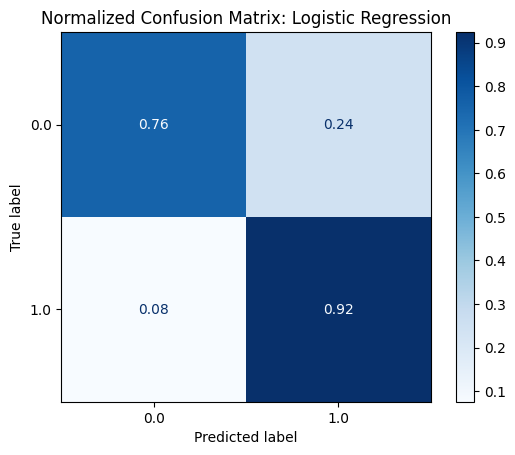


===== SVM =====
Best Parameters: {'C': 10, 'kernel': 'rbf'}
Best Cross-Validation Accuracy: 0.9468
Accuracy : 0.9430
Precision: 0.9494
Recall   : 0.9670
F1 Score : 0.9581
AUC      : 0.9888
Classification Report:
               precision    recall  f1-score   support

         0.0       0.93      0.89      0.91      1304
         1.0       0.95      0.97      0.96      2696

    accuracy                           0.94      4000
   macro avg       0.94      0.93      0.93      4000
weighted avg       0.94      0.94      0.94      4000



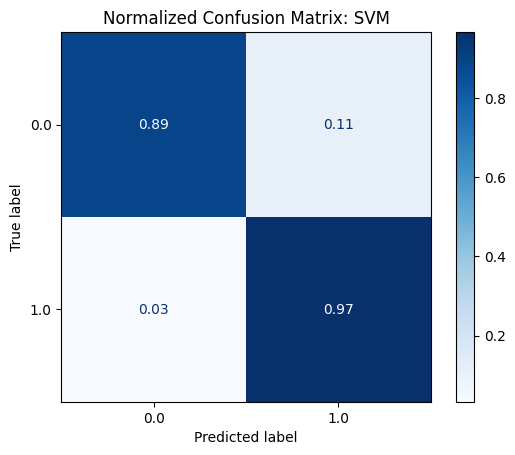


===== Naive Bayes =====
Best Parameters: {}
Best Cross-Validation Accuracy: 0.8534
Accuracy : 0.8478
Precision: 0.9172
Recall   : 0.8509
F1 Score : 0.8828
AUC      : 0.9253
Classification Report:
               precision    recall  f1-score   support

         0.0       0.73      0.84      0.78      1304
         1.0       0.92      0.85      0.88      2696

    accuracy                           0.85      4000
   macro avg       0.82      0.85      0.83      4000
weighted avg       0.86      0.85      0.85      4000



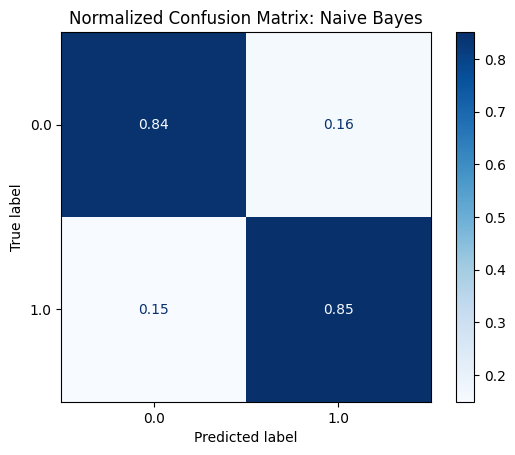


===== Gradient Boosting =====
Best Parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.9997
Accuracy : 0.9995
Precision: 0.9993
Recall   : 1.0000
F1 Score : 0.9996
AUC      : 1.0000
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1304
         1.0       1.00      1.00      1.00      2696

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



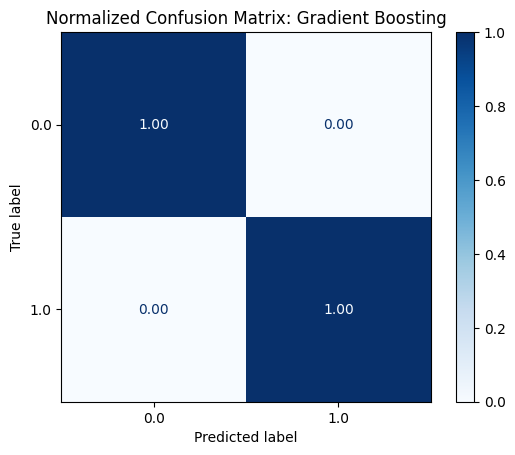


===== XGBoost =====
Best Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.9991
Accuracy : 0.9988
Precision: 0.9989
Recall   : 0.9993
F1 Score : 0.9991
AUC      : 1.0000
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1304
         1.0       1.00      1.00      1.00      2696

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



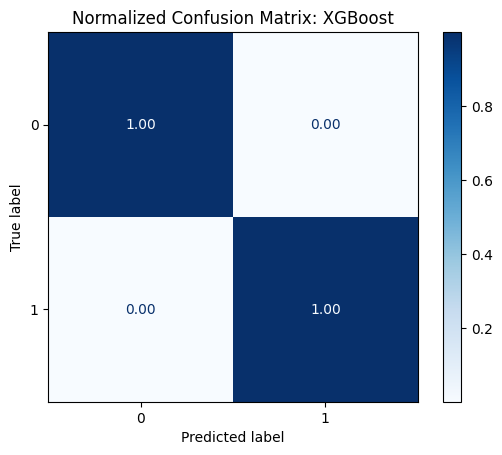


===== Decision Tree =====
Best Parameters: {'max_depth': None}
Best Cross-Validation Accuracy: 0.9972
Accuracy : 0.9965
Precision: 0.9970
Recall   : 0.9978
F1 Score : 0.9974
AUC      : 0.9958
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1304
         1.0       1.00      1.00      1.00      2696

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



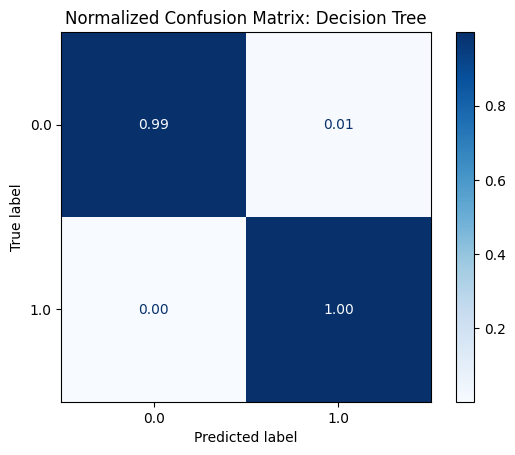


===== Random Forest =====
Best Parameters: {'max_depth': None, 'n_estimators': 50}
Best Cross-Validation Accuracy: 0.9981
Accuracy : 0.9975
Precision: 0.9967
Recall   : 0.9996
F1 Score : 0.9981
AUC      : 1.0000
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      1304
         1.0       1.00      1.00      1.00      2696

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



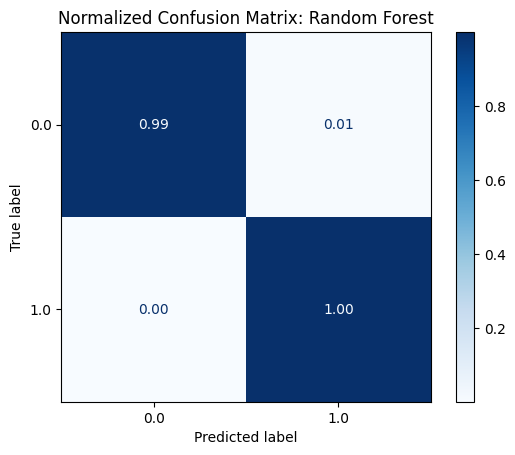


===== KNN =====
Best Parameters: {'n_neighbors': 7}
Best Cross-Validation Accuracy: 0.9233
Accuracy : 0.9280
Precision: 0.9315
Recall   : 0.9640
F1 Score : 0.9475
AUC      : 0.9733
Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.85      0.89      1304
         1.0       0.93      0.96      0.95      2696

    accuracy                           0.93      4000
   macro avg       0.93      0.91      0.92      4000
weighted avg       0.93      0.93      0.93      4000



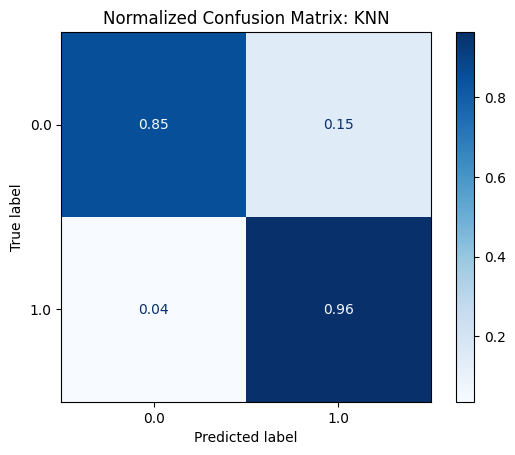

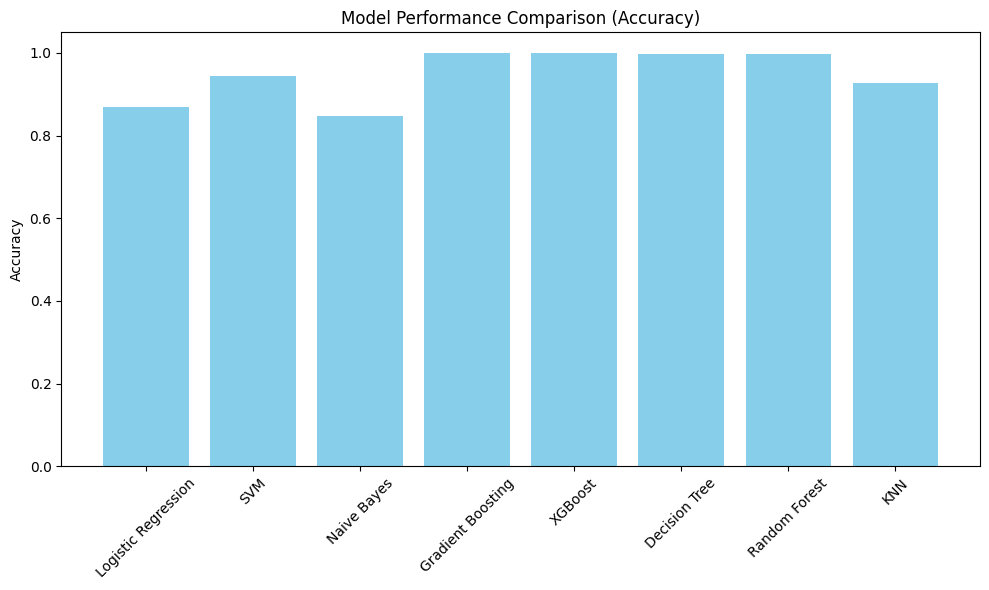


Confusion Matrix for Logistic Regression (Normalized):
[[0.75613497 0.24386503]
 [0.07566766 0.92433234]]

Confusion Matrix for SVM (Normalized):
[[0.89340491 0.10659509]
 [0.03301187 0.96698813]]

Confusion Matrix for Naive Bayes (Normalized):
[[0.84125767 0.15874233]
 [0.14910979 0.85089021]]

Confusion Matrix for Gradient Boosting (Normalized):
[[0.99846626 0.00153374]
 [0.         1.        ]]

Confusion Matrix for XGBoost (Normalized):
[[9.97699387e-01 2.30061350e-03]
 [7.41839763e-04 9.99258160e-01]]

Confusion Matrix for Decision Tree (Normalized):
[[0.99386503 0.00613497]
 [0.00222552 0.99777448]]

Confusion Matrix for Random Forest (Normalized):
[[9.93098160e-01 6.90184049e-03]
 [3.70919881e-04 9.99629080e-01]]

Confusion Matrix for KNN (Normalized):
[[0.85352761 0.14647239]
 [0.03597923 0.96402077]]


In [35]:
# 6. Assess: Training, Tuning, Evaluation & Performance Plot
performance_scores = {}
confusion_matrices = {}
results = []

for name, mp in models.items():
    print(f"\n===== {name} =====")

    # Hyperparameter tuning with 5-fold cross-validation
    grid = GridSearchCV(mp["model"], mp["params"], cv=5, scoring='accuracy', n_jobs=-1)
    grid.fit(X_train, y_train)

    print(f"Best Parameters: {grid.best_params_}")
    print(f"Best Cross-Validation Accuracy: {grid.best_score_:.4f}")

    # Predictions
    y_pred = grid.predict(X_test)

    # Probabilities for AUC
    if hasattr(grid.best_estimator_, "predict_proba"):
        y_prob = grid.predict_proba(X_test)[:, 1]
    elif hasattr(grid.best_estimator_, "decision_function"):
        y_prob = grid.decision_function(X_test)
    else:
        y_prob = np.nan

    # Evaluation Metrics
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob) if not isinstance(y_prob, float) and not np.isnan(y_prob).any() else np.nan

    # Store results
    performance_scores[name] = acc
    results.append({
        'Model': name, 'Accuracy': acc, 'Precision': prec,
        'Recall': rec, 'F1 Score': f1, 'AUC': auc
    })

    # Print metrics
    print(f"Accuracy : {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall   : {rec:.4f}")
    print(f"F1 Score : {f1:.4f}")
    print(f"AUC      : {auc:.4f}" if not np.isnan(auc) else "AUC      : Not applicable")
    print("Classification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix (Normalized)
    cm = confusion_matrix(y_test, y_pred, normalize='true')
    confusion_matrices[name] = cm
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=grid.classes_)
    disp.plot(cmap='Blues', values_format=".2f")
    plt.title(f"Normalized Confusion Matrix: {name}")
    plt.show()

# Bar chart of model performance
plt.figure(figsize=(10, 6))
plt.bar(performance_scores.keys(), performance_scores.values(), color='skyblue')
plt.ylabel("Accuracy")
plt.xticks(rotation=45)
plt.title("Model Performance Comparison (Accuracy)")
plt.tight_layout()
plt.show()

# Print all confusion matrices
for model_name, cm in confusion_matrices.items():
    print(f"\nConfusion Matrix for {model_name} (Normalized):\n{cm}")


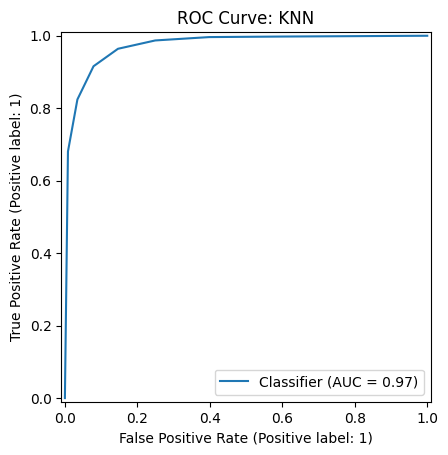

In [26]:
    # ROC Curve
    RocCurveDisplay.from_predictions(y_test, y_prob)
    plt.title(f"ROC Curve: {name}")
    plt.show()

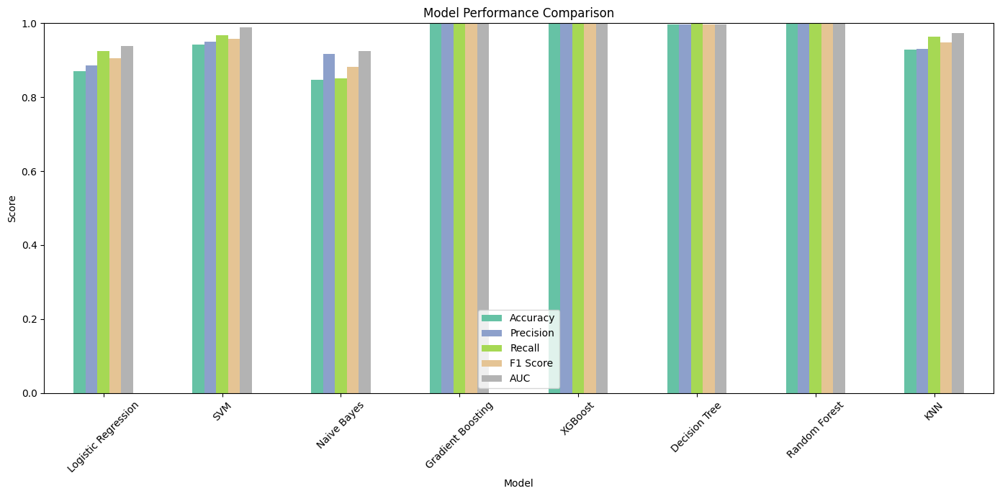

In [27]:
# Plotting Model Accuracies
results_df = pd.DataFrame(results)
results_df.set_index('Model')[['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC']].plot(
    kind='bar', figsize=(14, 7), title='Model Performance Comparison', colormap='Set2')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.tight_layout()
plt.show()